Importing the necessary libraries.

In [1]:
import pandas as pd
import numpy as np
import seaborn as sb
import matplotlib.pyplot as plt
import pandas_profiling as pdp
import plotly_express as plx
import warnings

Importing the Data and looking at the first 4 lines.

In [2]:
Data= pd.read_json('Psi-dataset.json', lines=True)
Data.head()

,amplitude_id,app_name,app_pillar,content_area,content_id,content_title,content_type,content_url,event_time,event_type,os_name,platform,referrer_url,session_id,user_tier
0,67422975592,news-ios-app,feed,news,None,None,index,None,2019-06-06 09:17:06.881,LOADED,ios,None,None,1559812626881,free
1,68763109149,news-android-app,feed,news,None,None,index,None,2019-06-06 09:08:20.539,LOADED,android,Web,None,1559812100539,free
2,68763109149,news-android-app,feed,news,1.5162715,san-francisco-to-force-some-addicts-into-treat...,story,None,2019-06-06 09:13:17.920,LOADED,android,Web,None,1559812100539,free
3,68763109149,news-android-app,feed,news,None,None,index,None,2019-06-06 09:16:43.830,LOADED,android,Web,None,1559812100539,free
4,24031894244,music-ios-app,None,music,None,hot-country,media,None,2019-06-06 09:24:24.184,STREAMED,ios,iOS,None,1559813064184,None


Generating a report to take a better look at the distribution of the features, missing values, unique values, and etc.

In [3]:
report=Data.profile_report(style={'full_width':True},correlations={"cramers": False})
report.to_file('Initial_report.html')

Looking at the content accessed by different user types.

In [4]:
df=Data.groupby(['user_tier','content_area']).amplitude_id.count()
df=df.reset_index()
df1=df.groupby('user_tier').amplitude_id.sum()
df1=df1.reset_index()
df1.columns=['user_tier','summation']
df=pd.merge(df,df1,left_on='user_tier',right_on='user_tier',how='left')
df['percentage']=df.amplitude_id.values/df.summation.values
df=df[['user_tier','content_area','percentage']].sort_values(['user_tier','percentage'],ascending=[True,False])
df

,user_tier,content_area,percentage
5,authenticated,news,0.632995
11,authenticated,video,0.234883
9,authenticated,sports,0.061167
1,authenticated,homepage,0.038099
6,authenticated,radio,0.012933
3,authenticated,lifestyle,0.006292
2,authenticated,kids,0.005942
4,authenticated,listen,0.003495
10,authenticated,tv,0.002796
7,authenticated,search,0.000699


Text(0.5, 1.0, 'Content Type Viewed Based on Different Type of Users')

<Figure size 1080x720 with 0 Axes>

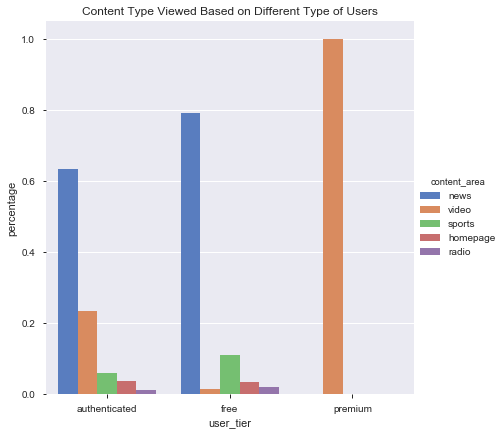

In [5]:
plt.figure(figsize=(15,10))
sb.catplot(x="user_tier", y="percentage", hue="content_area", 
           data=df[df['content_area'].isin(['news','sports','homepage','video','radio'])],
                height=6, kind="bar", palette="muted")
plt.title('Content Type Viewed Based on Different Type of Users')

Grouping users based on number of clicks that they had.

In [6]:
User_visit=Data.groupby('amplitude_id').count()
User_visit=User_visit['session_id']
User_visit=User_visit.reset_index()
User_visit.columns=['amplitude_id','user_visit']
Data= pd.merge(Data, User_visit, left_on=['amplitude_id'], right_on=['amplitude_id'],how='left')

In [7]:
Data['visit_group']='null'
Data.loc[Data['user_visit']<6,'visit_group']='1-5 visits'
Data.loc[(Data['user_visit']>5) & (Data['user_visit']<11),'visit_group']='6-10 visits'
Data.loc[(Data['user_visit']>10) & (Data['user_visit']<16),'visit_group']='11-15 visits'
Data.loc[(Data['user_visit']>15) & (Data['user_visit']<21),'visit_group']='16-20 visits'
Data.loc[Data['user_visit']>20,'visit_group']='more than 20 visits'

Looking at content viewed based on visitor groups. The data visualization has been created in Power BI.

In [8]:
Visit_analysis=Data[Data['content_area'].isin(['news','sports','homepage','video','radio'])]\
.groupby(['visit_group','content_area']).amplitude_id.count()

Visit_analysis=Visit_analysis.reset_index()
Visit_analysis.columns=['visit_group','content_area','visit_num']
Visit_analysis.sort_values(['visit_group','visit_num'],ascending=[True,False])
#Visit_analysis.to_csv('Visit_Analysis.csv')

,visit_group,content_area,visit_num
1,1-5 visits,news,47579
3,1-5 visits,sports,8539
0,1-5 visits,homepage,2502
2,1-5 visits,radio,1696
4,1-5 visits,video,1371
6,11-15 visits,news,12794
8,11-15 visits,sports,1112
5,11-15 visits,homepage,432
9,11-15 visits,video,170
7,11-15 visits,radio,164


Looking at number of users in each group.

In [10]:
A=[]
B=[]
for group in Data.visit_group.unique():
    A.append(group)
    B+=[len(Data[Data['visit_group']==group].amplitude_id.unique())]
User_count=pd.DataFrame({'visit_group':A,
                        'user_count' :B})
A, B = User_count.iloc[3], User_count.iloc[4]
User_count.iloc[3], User_count.iloc[4] = B, A
#User_count.to_csv('user_count.csv')    

Looking at average time spent by each group on the website based on number of clicks.

In [11]:
User_Engagement=Data[Data['user_visit']>1].groupby('amplitude_id').event_time.agg({'min_time':np.min,'max_time':np.max})
User_Engagement['total_time']=User_Engagement.max_time-User_Engagement.min_time
User_Engagement=User_Engagement.reset_index()
User_Engagement=User_Engagement[['amplitude_id','total_time']]
User_Engagement=pd.merge(User_Engagement,Data,left_on=['amplitude_id'], right_on=['amplitude_id'],how='left')
User_Engagement['Num_time']=User_Engagement.total_time.values.astype(np.int64)


In [12]:
df=User_Engagement.groupby('visit_group').Num_time.agg({'avg_time':np.mean})
df['time_spent']=pd.to_timedelta(df.avg_time)

df=df.reset_index()
df=df[['visit_group','time_spent']]
df.columns=['visit_group','avg_time_spent']
df=df.sort_values('visit_group')
A, B = df.iloc[1], df.iloc[2]
df.iloc[1], df.iloc[2] = B, A
df

,visit_group,avg_time_spent
0,1-5 visits,00:03:24.353901
1,16-20 visits,00:15:42.475088
2,11-15 visits,00:12:09.763720
3,6-10 visits,00:08:12.025642
4,more than 20 visits,00:19:02.609507


In [13]:
Content_Engagement=Data[['amplitude_id','content_area','event_time']]
Content_Engagement.sort_values(['amplitude_id','event_time'], inplace=True)
Content_Engagement['next_amplitude_id']=np.nan
Content_Engagement['next_event_time']=np.nan
Content_Engagement['next_amplitude_id'].iloc[:-1]=Content_Engagement['amplitude_id'].iloc[1:].values
Content_Engagement['next_event_time'].iloc[:-1]=Content_Engagement['event_time'].iloc[1:].values
Content_Engagement['next_event_time']=Content_Engagement['next_event_time']/1000000
Content_Engagement['next_event_time']=pd.to_datetime(Content_Engagement['next_event_time'],unit='ms')

Content_Engagement['time_spent']=np.nan
df=Content_Engagement[Content_Engagement['amplitude_id']==Content_Engagement['next_amplitude_id']]
df['time_spent']=df['next_event_time']-df['event_time']
df['Num_time']=df.time_spent.values.astype(np.int64)
#df=df.groupby('content_area').Num_time.agg({'avg_time':np.mean})
#df['time_spent']=pd.to_timedelta(df.avg_time)
Content_Engagement=df.sort_values('Num_time',ascending=False)
Content_Engagement.Num_time=Content_Engagement.Num_time.values/60000000000.0
Content_Engagement=Content_Engagement.reset_index()

In [14]:
#Content_Engagement.to_csv('Content_Engagement.CSV')
df=Content_Engagement[['amplitude_id','event_time','Num_time']]
Data=pd.merge(Data,df,left_on=['amplitude_id','event_time'],right_on=['amplitude_id','event_time'],how='left')

Looking at distribution of time spent on different event types. The average of time spent on website based on event type has been shown in Power BI.

In [24]:
Event_Type=Data[['event_type','Num_time']]
df=Event_Type.groupby('event_type').Num_time.agg({'avg_time':np.mean})
df=df.reset_index()
#df.to_csv('Event_Type_Data.csv')

Event_Type.columns=['Event Type','Time in Minutes']
plx.box(Event_Type,x='Event Type',y='Time in Minutes',title='Time Spent on Different Event Types')

Looking at the distribuiton of Time spent on each content type. The average Time spent has been plotted in Power BI.

In [17]:
df=Content_Engagement
df=df[['content_area','Num_time']]
df.columns=['Content Area','Time in Minutes']
Content_Engagement=df

In [18]:
plx.box(Content_Engagement,x='Content Area',y='Time in Minutes',title='Time Spent on Different Content on CBC')

Looking at the distribution of time spent on CBC website based on users number of clicks.

In [19]:
df=User_Engagement[['amplitude_id','Num_time','visit_group','user_visit']]
df.Num_time=df.Num_time.values/60000000000.0
df.drop_duplicates(inplace=True)
df.sort_values('user_visit',inplace=True)
df.columns=['amplitude_id','Time in Minutes','Number of Clicks','user_visit']


In [20]:
plx.box(df,x='Number of Clicks',y='Time in Minutes',title='Time Spent on CBC Based on Number of Clicks')